# 2.3: Complex Machine Learning Models and Keras Part 2

### 1. Importing Libraries and Data
### 2. Data Wrangling.
### 3. Reshaping for modeling.
### 4. Data Split.
### 5. Random Forest Model.
### 6. Uncovering Feature Importances.
### 7. Modeling the 4 Most Influential Weather Stations and Uncovering their Feature Importances:anatances

In [418]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn.model_selection import train_test_split
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree

In [420]:
# Ensures the charts created are displayed in the notebook without the need to "call" them.
%matplotlib inline

# Turning off warning feature
import warnings
warnings.filterwarnings('ignore')

# Supress scientific notation for easier analysis profiling
pd.set_option('display.float_format', '{:.2f}'.format)

pd.set_option('display.max_columns', None)

In [422]:
#Create a path to where your data is stored.
path = r'C:\Users\IVON6\ClimateWins'

In [424]:
#Read in the European weather data and Answers Data set.

climate = pd.read_csv(os.path.join(path, '02 Data',  'Unsupervised', 'climate_clean.csv'))
answers = pd.read_csv(os.path.join(path, '02 Data',  'Unsupervised', 'answers_clean.csv'))

In [426]:
climate.head()

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,BELGRADE_humidity,BELGRADE_pressure,BELGRADE_global_radiation,BELGRADE_precipitation,BELGRADE_sunshine,BELGRADE_temp_mean,BELGRADE_temp_min,BELGRADE_temp_max,BUDAPEST_cloud_cover,BUDAPEST_humidity,BUDAPEST_pressure,BUDAPEST_global_radiation,BUDAPEST_precipitation,BUDAPEST_sunshine,BUDAPEST_temp_mean,BUDAPEST_temp_min,BUDAPEST_temp_max,DEBILT_cloud_cover,DEBILT_humidity,DEBILT_pressure,DEBILT_global_radiation,DEBILT_precipitation,DEBILT_sunshine,DEBILT_temp_mean,DEBILT_temp_min,DEBILT_temp_max,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max,HEATHROW_cloud_cover,HEATHROW_humidity,HEATHROW_pressure,HEATHROW_global_radiation,HEATHROW_precipitation,HEATHROW_sunshine,HEATHROW_temp_mean,HEATHROW_temp_min,HEATHROW_temp_max,KASSEL_humidity,KASSEL_pressure,KASSEL_global_radiation,KASSEL_precipitation,KASSEL_sunshine,KASSEL_temp_mean,KASSEL_temp_min,KASSEL_temp_max,LJUBLJANA_cloud_cover,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max,MADRID_cloud_cover,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max,OSLO_cloud_cover,OSLO_humidity,OSLO_pressure,OSLO_global_radiation,OSLO_precipitation,OSLO_sunshine,OSLO_temp_mean,OSLO_temp_min,OSLO_temp_max,SONNBLICK_cloud_cover,SONNBLICK_humidity,SONNBLICK_pressure,SONNBLICK_global_radiation,SONNBLICK_precipitation,SONNBLICK_sunshine,SONNBLICK_temp_mean,SONNBLICK_temp_min,SONNBLICK_temp_max,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,STOCKHOLM_humidity,MUNCHENB_pressure,KASSEL__cloud_cover
0,7,0.85,1.02,0.32,0.09,0.70,6.50,0.80,10.90,1,0.81,1.02,0.88,0.00,7.00,3.70,-0.90,7.90,4,0.67,1.02,0.44,0.01,2.30,2.40,-0.40,5.10,7,0.85,1.00,0.07,0.25,0.00,9.30,7.40,11.00,8,0.83,1.02,0.12,0.08,0.00,10.00,7.00,11.50,7,0.91,1.00,0.13,0.22,0.00,10.60,9.40,8.30,0.82,1.01,0.28,0.48,1.60,7.90,3.90,9.40,8,1.00,1.02,0.20,0.00,0.00,-0.60,-1.90,0.50,7,0.83,1.01,0.22,0.32,1.00,9.50,8.50,11.10,6,0.92,1.03,0.53,0.00,1.40,7.60,4.40,10.80,5,0.67,0.20,0.10,0.00,6.90,1.10,10.40,8,0.98,1.00,0.04,1.14,0.00,4.90,3.80,5.90,4,0.73,1.03,0.48,0.01,2.30,-5.90,-8.50,-3.20,5,1.01,0.05,0.32,0.00,4.20,2.20,4.90,5,0.88,1.00,0.45,0.34,4.70,8.50,6.00,10.90,0.98,1.03,8
1,6,0.84,1.02,0.36,1.05,1.10,6.10,3.30,10.10,6,0.84,1.02,0.25,0.00,0.00,2.90,2.20,4.40,4,0.67,1.02,0.18,0.31,0.00,2.30,1.40,3.10,8,0.90,1.01,0.14,0.06,0.10,7.70,6.40,8.30,8,0.89,1.02,0.18,0.66,0.50,8.20,7.40,11.00,7,0.98,1.01,0.13,0.23,0.00,6.10,3.90,10.60,0.86,1.01,0.12,0.27,0.00,7.70,6.80,9.10,6,0.94,1.02,0.56,0.13,3.20,2.10,-1.30,5.50,8,0.92,1.01,0.17,1.34,0.40,8.60,7.50,9.90,7,0.86,1.03,0.46,0.00,0.90,9.80,7.40,12.20,6,0.72,0.61,0.30,5.10,6.20,4.20,10.20,8,0.62,1.01,0.04,0.00,0.00,3.40,2.80,4.90,6,0.97,1.03,0.21,0.61,0.00,-9.50,-10.50,-8.50,5,1.01,0.05,0.06,0.00,4.00,3.00,5.00,7,0.91,1.00,0.25,0.84,0.70,8.90,5.60,12.10,0.62,1.03,6
2,8,0.90,1.02,0.18,0.30,0.00,8.50,5.10,9.90,6,0.77,1.02,0.67,0.00,3.50,3.10,

In [428]:
answers.head()

,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [430]:
climate.shape

(22950, 135)

In [432]:
answers.shape

(22950, 15)

## Reshaping for Modeling

In [435]:
X = climate

In [437]:
y = answers

In [439]:
# Turn X and y from a df to arrays

X = np.array(X)
y = np.array(y)

In [441]:
X.shape

(22950, 135)

In [443]:
y.shape

(22950, 15)

## Data Split

In [446]:
# Split data into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [448]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 135) (17212, 15)
(5738, 135) (5738, 15)


## Random Forest Model

In [451]:
# Create a RF classifier
clf = RandomForestClassifier(n_estimators = 100)
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [455]:
# Perform predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Use metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.7129661903102126


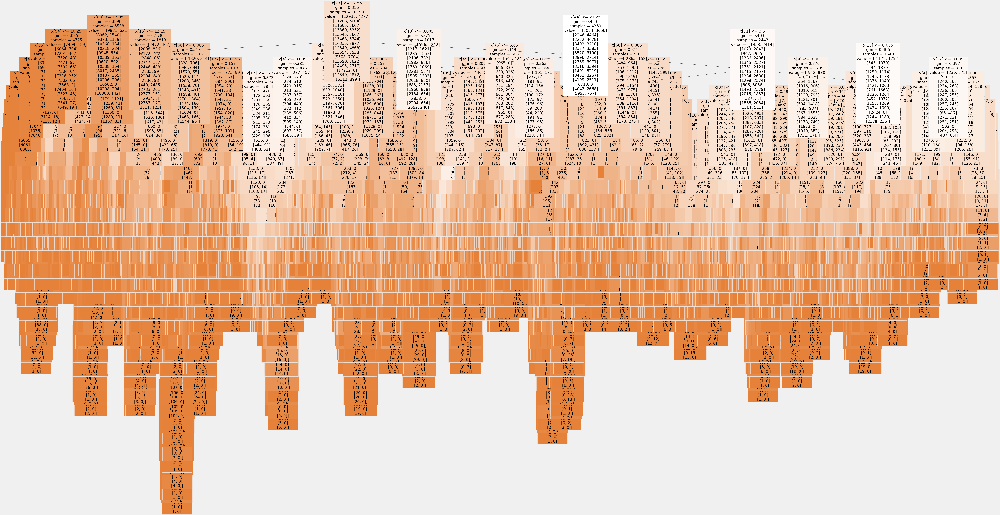

In [457]:
# Class-names = {0:'Unpleasant Weather', 1:'Pleasant Weather'}

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, filled=True);

plt.show()

In [459]:
#fig.savefig(os.path.join(path, '04 Visualizations', 'random_forest_2010s.png'),bbox_inches='tight')

## Uncovering Feature Importances

In [462]:
# Retrieve feature importances from the trained model

newarray = clf.feature_importances_
print(clf.feature_importances_.shape)
newarray

(135,)


array([0.00261844, 0.00266719, 0.00181318, 0.00346341, 0.01815756,
       0.00626407, 0.01616822, 0.00485963, 0.02286918, 0.00348787,
       0.00296424, 0.00296993, 0.00316263, 0.0207907 , 0.00378027,
       0.00557417, 0.00305625, 0.01232441, 0.00149472, 0.00175498,
       0.00174818, 0.00276378, 0.01882687, 0.00321593, 0.01129471,
       0.00507431, 0.02000931, 0.00387458, 0.00242095, 0.00429901,
       0.00371719, 0.01701862, 0.00542564, 0.00735627, 0.00227778,
       0.04402833, 0.00388736, 0.00243155, 0.0030082 , 0.00440409,
       0.02131522, 0.00662501, 0.01087765, 0.00228632, 0.04488456,
       0.00181052, 0.00307057, 0.00397327, 0.0034405 , 0.01258319,
       0.00320692, 0.01061188, 0.00443263, 0.01993575, 0.00303712,
       0.00293633, 0.00308853, 0.01234427, 0.00413557, 0.00467681,
       0.00261832, 0.00786948, 0.00257087, 0.0029246 , 0.00267618,
       0.00339117, 0.02134995, 0.00405799, 0.01114803, 0.00239058,
       0.02886488, 0.00571278, 0.00313945, 0.00380823, 0.00403

In [464]:
# Reshape newarray

newarray = newarray.reshape(-1,15,9)
print(newarray.shape)
newarray

(1, 15, 9)


array([[[0.00261844, 0.00266719, 0.00181318, 0.00346341, 0.01815756,
         0.00626407, 0.01616822, 0.00485963, 0.02286918],
        [0.00348787, 0.00296424, 0.00296993, 0.00316263, 0.0207907 ,
         0.00378027, 0.00557417, 0.00305625, 0.01232441],
        [0.00149472, 0.00175498, 0.00174818, 0.00276378, 0.01882687,
         0.00321593, 0.01129471, 0.00507431, 0.02000931],
        [0.00387458, 0.00242095, 0.00429901, 0.00371719, 0.01701862,
         0.00542564, 0.00735627, 0.00227778, 0.04402833],
        [0.00388736, 0.00243155, 0.0030082 , 0.00440409, 0.02131522,
         0.00662501, 0.01087765, 0.00228632, 0.04488456],
        [0.00181052, 0.00307057, 0.00397327, 0.0034405 , 0.01258319,
         0.00320692, 0.01061188, 0.00443263, 0.01993575],
        [0.00303712, 0.00293633, 0.00308853, 0.01234427, 0.00413557,
         0.00467681, 0.00261832, 0.00786948, 0.00257087],
        [0.0029246 , 0.00267618, 0.00339117, 0.02134995, 0.00405799,
         0.01114803, 0.00239058, 0.0288648

In [466]:
# Collapse this shape into one observation for each weather station

sumarray = np.sum(newarray[0], axis=1)
sumarray

array([0.07888088, 0.05811048, 0.06618279, 0.09041837, 0.09971996,
       0.06306525, 0.0432773 , 0.08251615, 0.11654997, 0.07762727,
       0.07202983, 0.04976643, 0.02426758, 0.05191466, 0.0256731 ])

In [468]:
# Extract stations list

stations = [col.split('_')[0] for col in climate.columns if '_' in col]

In [470]:
# Create a set of unique station names

unique_stations = set(stations)
unique_stations

# Convert the set of unique stations to a list

unique_stations_list = list(unique_stations)

In [472]:
important = pd.Series(sumarray, index = unique_stations_list)
important = important.sort_values(ascending = False)
important

STOCKHOLM    0.12
MAASTRICHT   0.10
OSLO         0.09
DEBILT       0.08
BASEL        0.08
BELGRADE     0.08
DUSSELDORF   0.07
KASSEL       0.07
VALENTIA     0.06
HEATHROW     0.06
MUNCHENB     0.05
MADRID       0.05
BUDAPEST     0.04
SONNBLICK    0.03
LJUBLJANA    0.02
dtype: float64

In [474]:
# Create a df to associate weather stations with their importances

df_importance = pd.DataFrame({
    'Weather Station': unique_stations_list,
    'Importance': sumarray
})

df_importance = df_importance.sort_values(by='Importance', ascending = False)

['BASEL', 'HEATHROW', 'KASSEL', 'OSLO', 'MAASTRICHT', 'VALENTIA', 'BUDAPEST', 'DEBILT', 'STOCKHOLM', 'BELGRADE', 'DUSSELDORF', 'MADRID', 'LJUBLJANA', 'MUNCHENB', 'SONNBLICK']


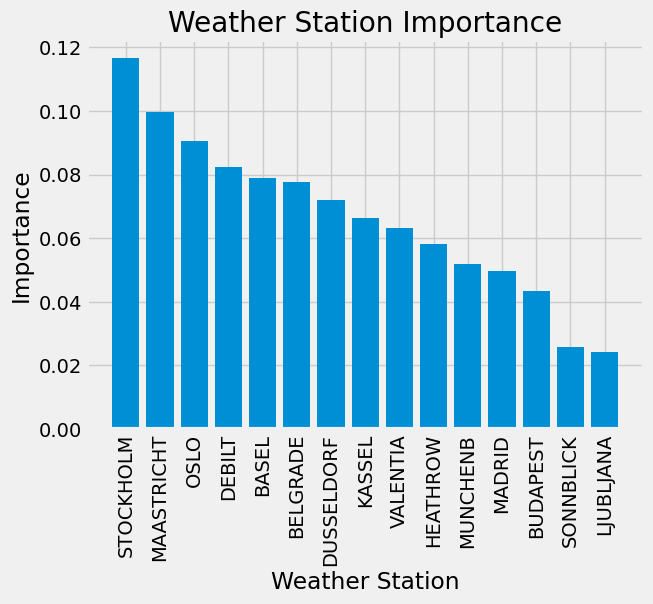

In [476]:
# Plot the results

%matplotlib inline

plt.style.use('fivethirtyeight')
print(unique_stations_list)

plt.bar(df_importance['Weather Station'], df_importance['Importance'], orientation = 'vertical')
plt.xticks(rotation='vertical')
plt.xlabel('Weather Station')
plt.ylabel('Importance')
plt.title('Weather Station Importance')
plt.show()

## Random Forest for STOCKHOLM data (all years)

In [479]:
# Create a list of the columns containing "STOCKHOLM" in their names


stockholm_list = list(x for x in climate.columns if x.find('STOCKHOLM') >=0)

# Create a dataframe with those columns

df_stockholm = climate[stockholm_list]
df_stockholm

,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max,STOCKHOLM_humidity
0,5,1.01,0.05,0.32,0.00,4.20,2.20,4.90,0.98
1,5,1.01,0.05,0.06,0.00,4.00,3.00,5.00,0.62
2,5,1.01,0.05,0.02,0.00,2.40,1.30,4.10,0.69
3,5,1.01,0.05,0.00,0.00,1.20,0.40,2.30,0.98
4,5,1.01,0.05,1.32,0.00,3.30,0.80,4.30,0.96
...,...,...,...,...,...,...,...,...,...
22945,5,1.02,1.11,0.14,3.20,11.50,8.20,14.20,0.98
22946,5,1.01,1.11,0.14,0.80,12.50,11.00,14.30,1.00
22947,5,1.01,1.11,0.14,6.90,13.10,12.10,14.40,0.85
22948,5,1.02,1.11,0.14,8.40,7.50,5.10,12.40,0.94


In [481]:
# Reduce answers dataset to STOCKHOLM's answers only

answers_stockholm = answers['STOCKHOLM_pleasant_weather']
answers_stockholm

0        0
1        0
2        0
3        0
4        0
        ..
22945    0
22946    0
22947    0
22948    0
22949    0
Name: STOCKHOLM_pleasant_weather, Length: 22950, dtype: int64

In [483]:
df_stockholm.shape # observations dataset has 

(22950, 9)

In [485]:
answers_stockholm.shape # predictions dataset has the correct shape

(22950,)

In [487]:
# Reshaping for modeling

X = df_stockholm
y = answers_stockholm

In [489]:
# Turn X and y from df to arrays

X = np.array(X)
y = np.array(y)

In [491]:
# Split data into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [493]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [495]:
# Create a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [497]:
# Perform predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Use metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


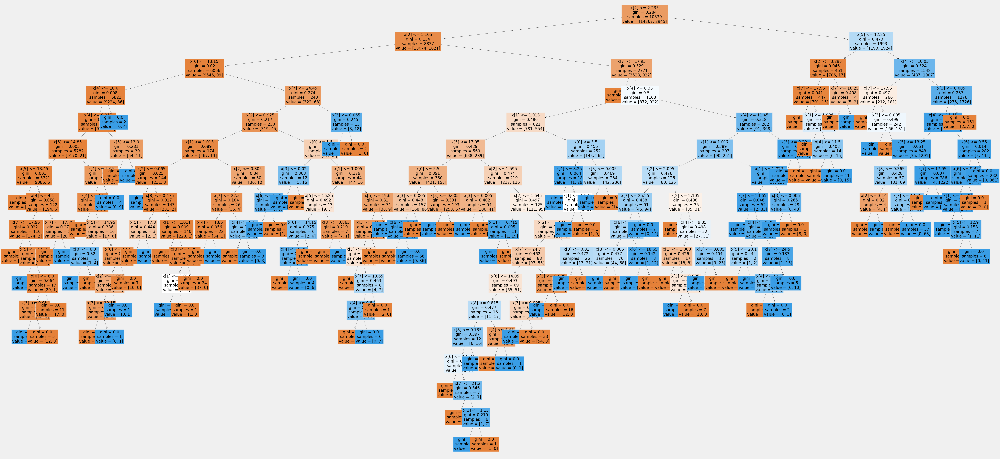

In [499]:
# Class-names = {0:'Unpleasant Weather', 1:'Pleasant Weather'}

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[6], fontsize = 20, filled=True);

plt.show()

In [501]:
# Retrieve feature importances from the trained model

newarray = clf.feature_importances_
print(clf.feature_importances_.shape)
newarray

(9,)


array([0.01290525, 0.0154003 , 0.07122357, 0.29155129, 0.09563225,
       0.14023091, 0.06103241, 0.30945342, 0.00257061])

In [503]:
# Create a list of weather features

wx_list = [feature.replace('STOCKHOLM_', '') for feature in stockholm_list]
wx_list

['cloud_cover',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max',
 'humidity']

In [505]:
important = pd.Series(newarray, index = wx_list).sort_values()
important

humidity           0.00
cloud_cover        0.01
pressure           0.02
temp_min           0.06
global_radiation   0.07
sunshine           0.10
temp_mean          0.14
precipitation      0.29
temp_max           0.31
dtype: float64

['cloud_cover', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max', 'humidity']


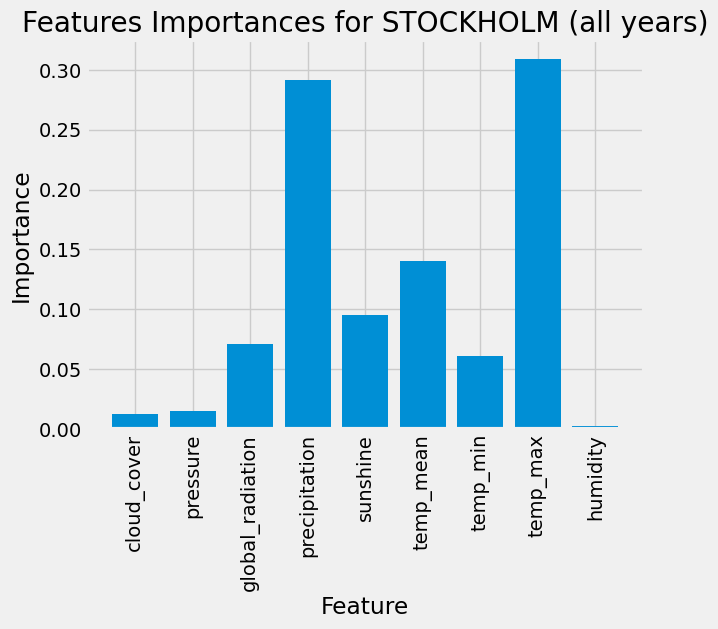

In [507]:
# Plot the results

%matplotlib inline
plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(newarray)))
print(wx_list)

plt.bar(x_values, newarray, orientation = 'vertical')
plt.xticks(x_values, wx_list, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Features Importances for STOCKHOLM (all years)');
plt.show()

## Random Forest for Maastricht data (all years)

In [512]:
# Create a list of the columns containing "Maastricht" in their names


maastricht_list = list(x for x in climate.columns if x.find('MAASTRICHT') >=0)

# Create a dataframe with those columns

df_maastricht = climate[maastricht_list]
df_maastricht

,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max
0,7,0.83,1.01,0.22,0.32,1.00,9.50,8.50,11.10
1,8,0.92,1.01,0.17,1.34,0.40,8.60,7.50,9.90
2,7,0.97,1.02,0.12,0.46,0.00,6.90,5.50,9.90
3,7,0.89,1.03,0.16,0.00,0.30,7.00,3.00,10.00
4,7,0.92,1.03,0.12,0.56,0.00,8.10,2.50,11.10
...,...,...,...,...,...,...,...,...,...
22945,8,0.67,1.02,1.17,0.20,5.30,18.60,14.10,22.60
22946,7,0.70,1.02,1.17,0.20,5.00,18.90,15.80,23.50
22947,8,0.69,1.02,1.17,0.20,3.20,18.20,13.70,24.30
22948,8,0.73,1.02,1.17,0.20,6.80,16.30,12.80,21.40


In [514]:
# Reduce answers dataset to maastricht's answers only

answers_maastricht = answers['MAASTRICHT_pleasant_weather']
answers_maastricht

0        0
1        0
2        0
3        0
4        0
        ..
22945    0
22946    0
22947    0
22948    0
22949    0
Name: MAASTRICHT_pleasant_weather, Length: 22950, dtype: int64

In [516]:
# Reshaping for modeling

X = df_maastricht
y = answers_maastricht

# Turn X and y from df to arrays

X = np.array(X)
y = np.array(y)

# Split data into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [518]:
# Create a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [520]:
# Perform predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Use metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


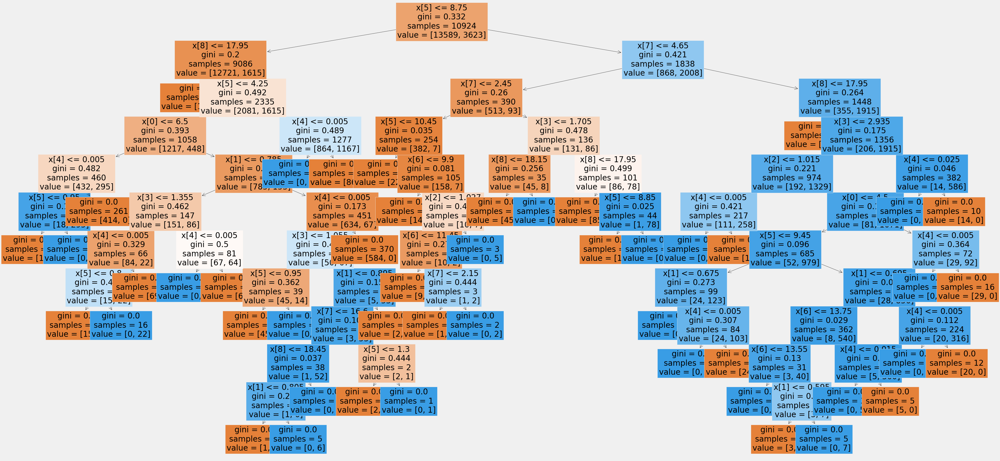

In [522]:
# Class-names = {0:'Unpleasant Weather', 1:'Pleasant Weather'}

fig = plt.figure(figsize=(40,20))
plot_tree(clf.estimators_[6], fontsize = 20, filled=True);

plt.show()


In [524]:
# Retrieve feature importances from the trained model

newarray = clf.feature_importances_
print(clf.feature_importances_.shape)
newarray

(9,)


array([0.02411638, 0.01954132, 0.01615126, 0.08819512, 0.31620986,
       0.08667599, 0.11264028, 0.01830549, 0.3181643 ])

In [526]:
# Create a list of weather features

wx_list = [feature.replace('MAASTRICHT_', '') for feature in maastricht_list]
wx_list

['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [528]:
important = pd.Series(newarray, index = wx_list).sort_values()
important

pressure           0.02
temp_min           0.02
humidity           0.02
cloud_cover        0.02
sunshine           0.09
global_radiation   0.09
temp_mean          0.11
precipitation      0.32
temp_max           0.32
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


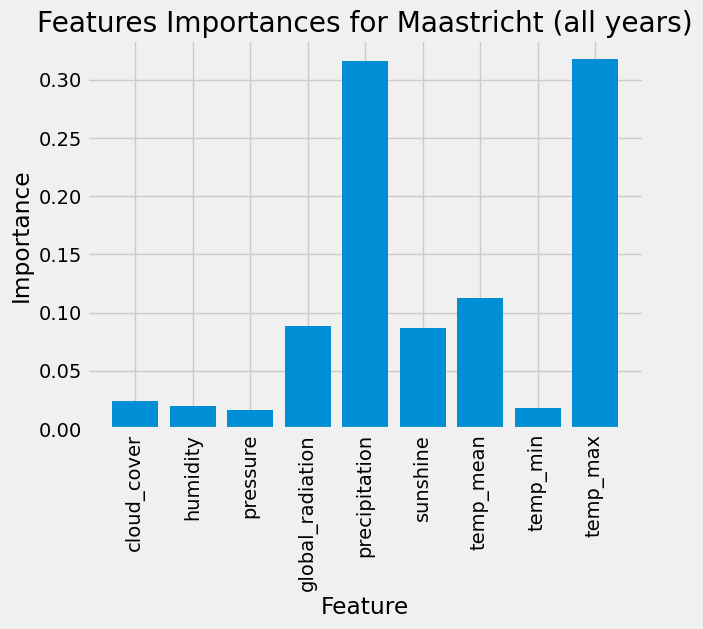

In [530]:
# Plot the results

%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(newarray)))
print(wx_list)

plt.bar(x_values, newarray, orientation = 'vertical')
plt.xticks(x_values, wx_list, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Features Importances for Maastricht (all years)');
plt.show()

## Random Forest for Oslo data (all years)

In [533]:
# Create a list of the columns containing "Oslo" in their names


oslo_list = list(x for x in climate.columns if x.find('OSLO') >=0)

# Create a dataframe with those columns

df_oslo = climate[oslo_list]
df_oslo

,OSLO_cloud_cover,OSLO_humidity,OSLO_pressure,OSLO_global_radiation,OSLO_precipitation,OSLO_sunshine,OSLO_temp_mean,OSLO_temp_min,OSLO_temp_max
0,8,0.98,1.00,0.04,1.14,0.00,4.90,3.80,5.90
1,8,0.62,1.01,0.04,0.00,0.00,3.40,2.80,4.90
2,8,0.69,1.02,0.04,0.08,0.00,1.90,0.60,3.10
3,8,0.98,1.02,0.04,0.35,0.00,3.00,0.40,4.90
4,8,0.96,1.01,0.05,0.26,0.00,3.70,2.90,4.90
...,...,...,...,...,...,...,...,...,...
22945,8,0.98,1.01,1.06,0.21,0.10,9.70,5.80,12.00
22946,8,1.00,1.01,1.06,0.21,0.00,10.90,8.80,11.70
22947,3,0.85,1.01,1.06,0.21,6.80,9.70,7.70,14.20
22948,5,0.94,1.01,1.06,0.21,2.90,5.90,2.10,8.10


In [535]:
# Reduce answers dataset to OSLO's answers only

answers_oslo = answers['OSLO_pleasant_weather']
answers_oslo

0        0
1        0
2        0
3        0
4        0
        ..
22945    0
22946    0
22947    0
22948    0
22949    0
Name: OSLO_pleasant_weather, Length: 22950, dtype: int64

In [537]:
df_oslo.shape # observations dataset has

(22950, 9)

In [539]:
# Reshaping for modeling

X = df_oslo
y = answers_oslo

# Turn X and y from df to arrays

X = np.array(X)
y = np.array(y)

# Split data into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [541]:
# Create a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [543]:
# Perform predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Use metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


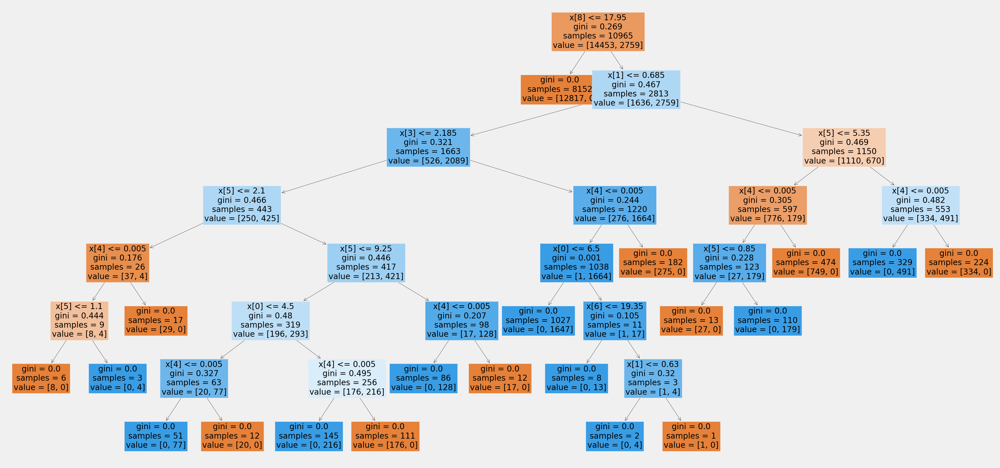

In [545]:
# Class-names = {0:'Unpleasant Weather', 1:'Pleasant Weather'}

fig = plt.figure(figsize=(40,20))
plot_tree(clf.estimators_[6], fontsize = 20, filled=True);

plt.show()

In [547]:
# Retrieve feature importances from the trained model

newarray = clf.feature_importances_
print(clf.feature_importances_.shape)
newarray

(9,)


array([0.01875099, 0.01439973, 0.01137909, 0.08662363, 0.30487887,
       0.08986445, 0.1308647 , 0.03575955, 0.30747899])

In [549]:
# Create a list of weather features

wx_list = [feature.replace('OSLO_', '') for feature in oslo_list]
wx_list

['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [551]:
important = pd.Series(newarray, index = wx_list).sort_values()
important

pressure           0.01
humidity           0.01
cloud_cover        0.02
temp_min           0.04
global_radiation   0.09
sunshine           0.09
temp_mean          0.13
precipitation      0.30
temp_max           0.31
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


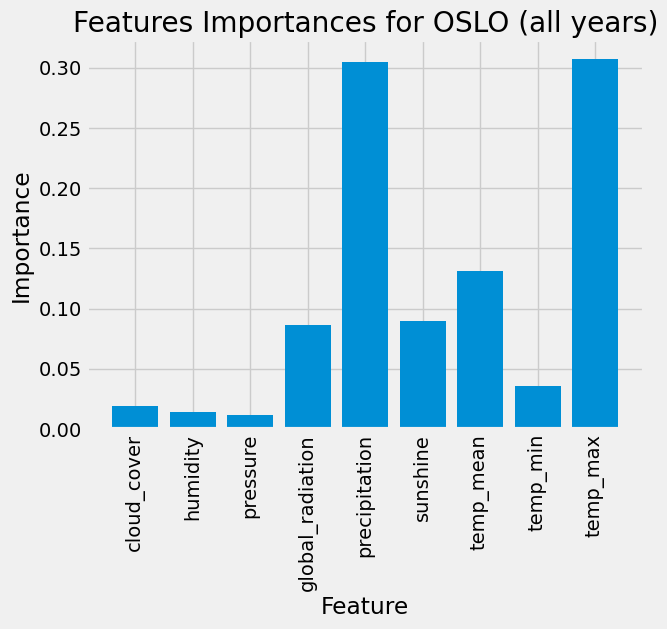

In [553]:
# Plot the results
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(newarray)))
print(wx_list)

plt.bar(x_values, newarray, orientation = 'vertical')
plt.xticks(x_values, wx_list, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Features Importances for OSLO (all years)');
plt.show()

## Random Forest for DEBILT data (all years)

In [556]:
# Create a list of the columns containing "DEBILT" in their names


debilt_list = list(x for x in climate.columns if x.find('DEBILT') >=0)

# Create a dataframe with those columns

df_debilt = climate[debilt_list]
df_debilt

,DEBILT_cloud_cover,DEBILT_humidity,DEBILT_pressure,DEBILT_global_radiation,DEBILT_precipitation,DEBILT_sunshine,DEBILT_temp_mean,DEBILT_temp_min,DEBILT_temp_max
0,7,0.85,1.00,0.07,0.25,0.00,9.30,7.40,11.00
1,8,0.90,1.01,0.14,0.06,0.10,7.70,6.40,8.30
2,6,0.92,1.02,0.28,0.01,3.00,6.80,4.60,9.90
3,8,0.95,1.03,0.08,0.09,0.00,6.70,3.60,10.10
4,6,0.90,1.02,0.04,0.39,0.00,8.00,2.40,11.20
...,...,...,...,...,...,...,...,...,...
22945,8,0.84,1.02,1.13,0.22,2.80,15.70,12.80,19.40
22946,8,0.84,1.02,1.13,0.22,3.50,16.00,10.30,20.50
22947,8,0.86,1.02,1.13,0.22,3.30,15.80,9.30,21.10
22948,8,0.87,1.02,1.13,0.22,6.00,14.40,10.30,20.20


In [558]:
# Reduce answers dataset to DEBILT's answers only

answers_debilt = answers['DEBILT_pleasant_weather']
answers_debilt

0        0
1        0
2        0
3        0
4        0
        ..
22945    0
22946    0
22947    0
22948    0
22949    0
Name: DEBILT_pleasant_weather, Length: 22950, dtype: int64

In [560]:
# Reshaping for modeling

X = df_debilt
y = answers_debilt

# Turn X and y from df to arrays

X = np.array(X)
y = np.array(y)

# Split data into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [562]:
# Create a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [564]:
# Perform predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Use metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


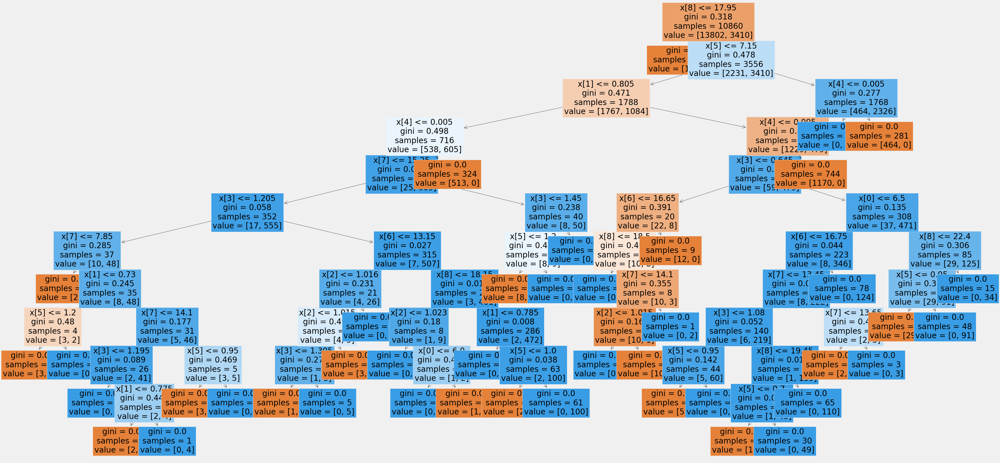

In [566]:
# Class-names = {0:'Unpleasant Weather', 1:'Pleasant Weather'}

fig = plt.figure(figsize=(40,20))
plot_tree(clf.estimators_[6], fontsize = 20, filled=True);

plt.show()

In [568]:
# Retrieve feature importances from the trained model

newarray = clf.feature_importances_
print(clf.feature_importances_.shape)
newarray

(9,)


array([0.02945632, 0.01212157, 0.01486669, 0.09357997, 0.31822203,
       0.07449689, 0.10326646, 0.01013823, 0.34385184])

In [570]:
# Create a list of weather features

wx_list = [feature.replace('DEBILT_', '') for feature in debilt_list]
wx_list

['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [572]:
important = pd.Series(newarray, index = wx_list).sort_values()
important

temp_min           0.01
humidity           0.01
pressure           0.01
cloud_cover        0.03
sunshine           0.07
global_radiation   0.09
temp_mean          0.10
precipitation      0.32
temp_max           0.34
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


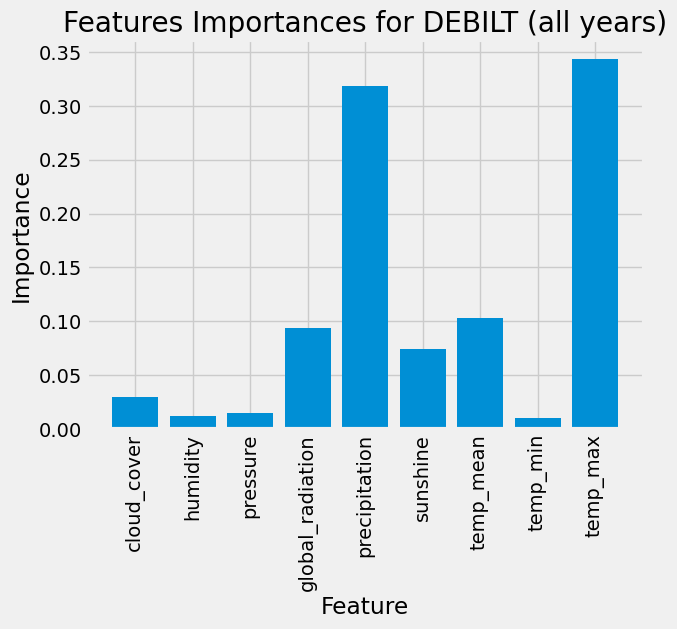

In [574]:
# Plot the results
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(newarray)))
print(wx_list)

plt.bar(x_values, newarray, orientation = 'vertical')
plt.xticks(x_values, wx_list, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Features Importances for DEBILT (all years)');
plt.show()